In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import os
import numpy as np
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from PIL import Image
from efficientnet_pytorch import EfficientNet

In [5]:
pip install efficientnet-pytorch

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16466 sha256=eb81a51a790b1f308d18830dcf10094e9dc66cbfcc0bf6426dbec78746bd122c
  Stored in directory: C:\Users\Krugl\AppData\Local\Temp\pip-ephem-wheel-cache-908mu_sy\wheels\8b\6f\9b\231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
Successfully built efficientnet-pytorch
Note: you may need to restart the kernel to use updated packages.


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Используем устройство: {device}')

Используем устройство: cuda


In [ ]:
data_train = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/'
data_valid = 'C:/Users/Krugl/Desktop/ВКР/archive/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid/'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(root=data_train, transform=transform)
val_dataset = datasets.ImageFolder(root=data_valid, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

In [ ]:
model = EfficientNet.from_pretrained('efficientnet-b0')
    
for param in model.parameters():
    param.requires_grad = False
    
num_features = model._fc.in_features
model._fc = nn.Linear(num_features, len(train_dataset.classes))
    
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

Loaded pretrained weights for efficientnet-b0


In [ ]:
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

In [ ]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Всего параметров: {total_params / 1e6:.2f} млн")

Всего параметров: 4.06 млн


In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad()
        
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct / total
    train_loss_history.append(train_loss)
    train_acc_history.append(train_accuracy)
    
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_loss /= len(val_loader)
    val_accuracy = 100 * correct / total
    val_loss_history.append(val_loss)
    val_acc_history.append(val_accuracy)
    
    print(f"Эпоха {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")

torch.save(model.state_dict(), 'efficientnet_plant_disease_model.pth')

Эпоха 1/10, Train Loss: 0.5978, Train Acc: 88.30%, Val Loss: 0.2243, Val Acc: 94.41%
Эпоха 2/10, Train Loss: 0.2226, Train Acc: 94.05%, Val Loss: 0.1555, Val Acc: 95.76%
Эпоха 3/10, Train Loss: 0.1724, Train Acc: 95.16%, Val Loss: 0.1282, Val Acc: 96.27%
Эпоха 4/10, Train Loss: 0.1499, Train Acc: 95.62%, Val Loss: 0.1167, Val Acc: 96.41%
Эпоха 5/10, Train Loss: 0.1335, Train Acc: 96.03%, Val Loss: 0.1076, Val Acc: 96.63%
Эпоха 6/10, Train Loss: 0.1222, Train Acc: 96.28%, Val Loss: 0.1001, Val Acc: 96.85%
Эпоха 7/10, Train Loss: 0.1159, Train Acc: 96.40%, Val Loss: 0.0955, Val Acc: 96.90%
Эпоха 8/10, Train Loss: 0.1114, Train Acc: 96.50%, Val Loss: 0.0909, Val Acc: 97.07%
Эпоха 9/10, Train Loss: 0.1081, Train Acc: 96.62%, Val Loss: 0.0896, Val Acc: 97.03%
Эпоха 10/10, Train Loss: 0.1053, Train Acc: 96.56%, Val Loss: 0.0892, Val Acc: 97.10%


In [ ]:
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_preds, target_names=train_dataset.classes))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.96      0.97       504
                                 Apple___Black_rot       0.98      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.98      1.00      0.99       440
                                   Apple___healthy       0.98      0.99      0.98       502
                               Blueberry___healthy       1.00      1.00      1.00       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       1.00      1.00      1.00       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.90      0.93       410
                       Corn_(maize)___Common_rust_       0.99      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Blight       0.92      0.96      0.

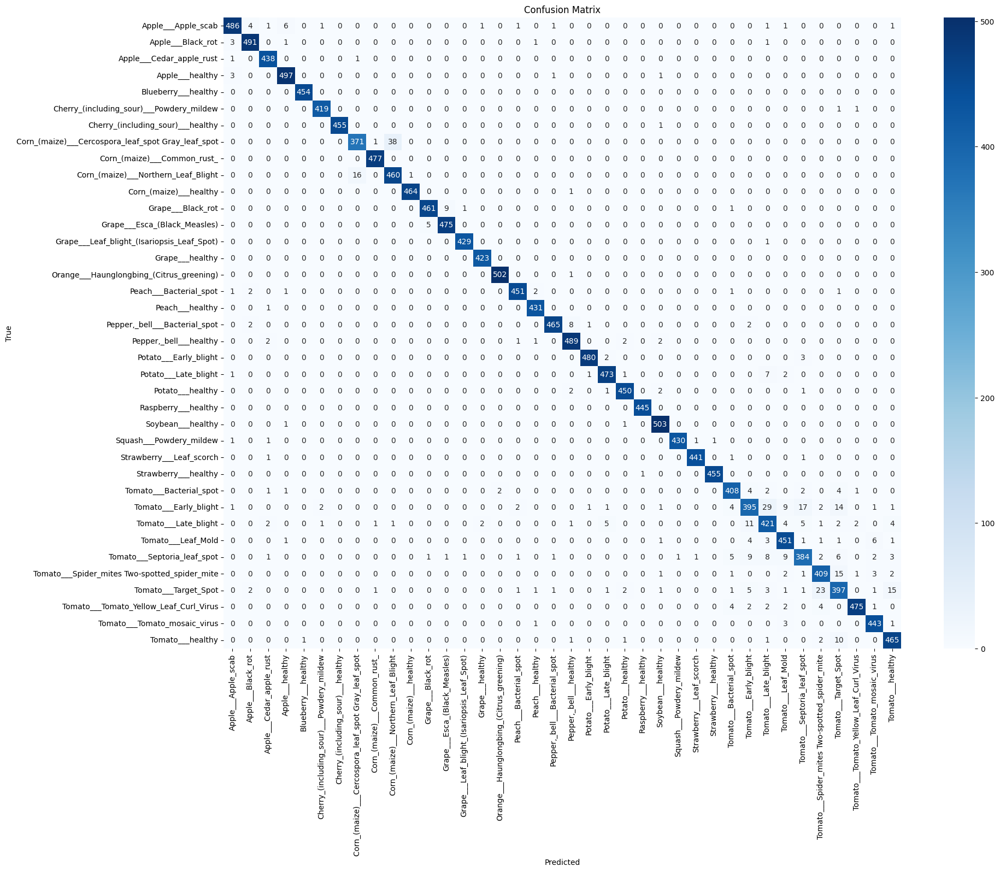

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=train_dataset.classes,
            yticklabels=train_dataset.classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

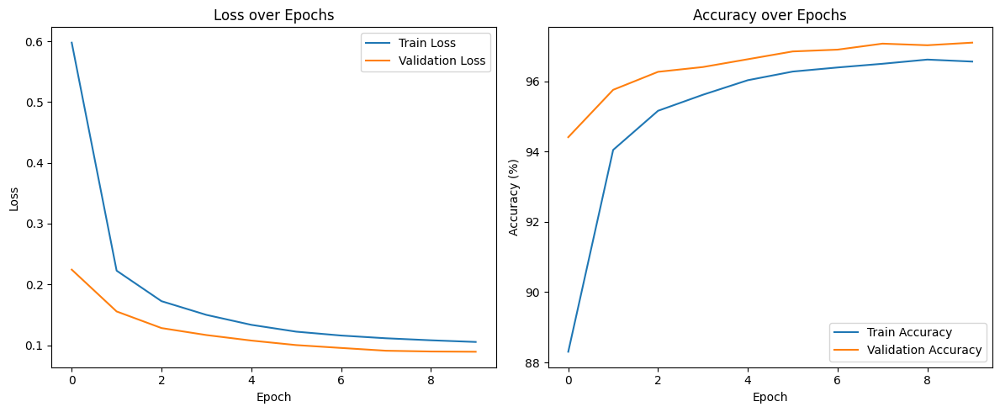

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_loss_history, label='Train Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_acc_history, label='Train Accuracy')
plt.plot(val_acc_history, label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()

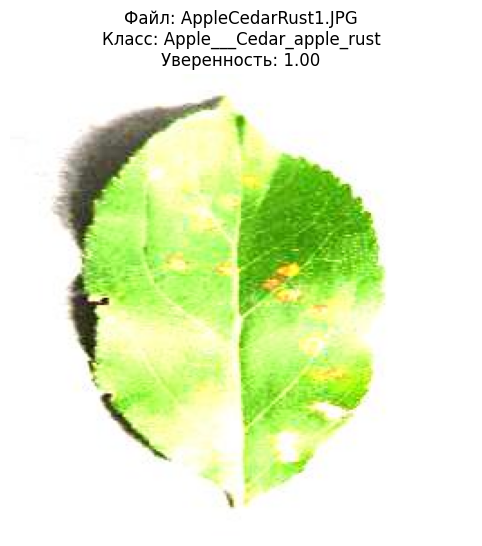

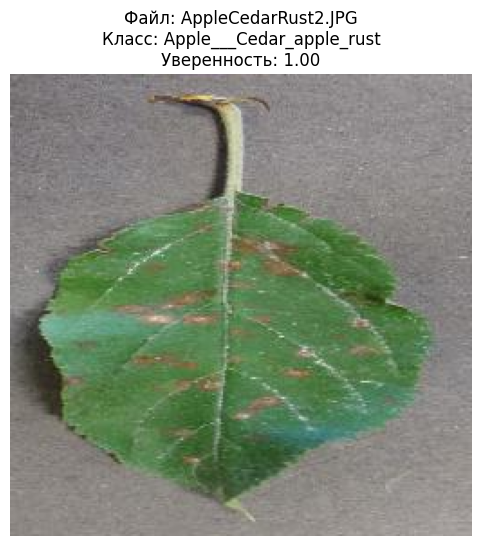

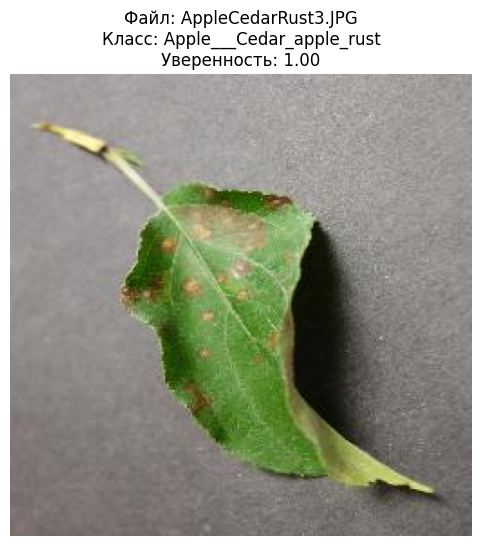

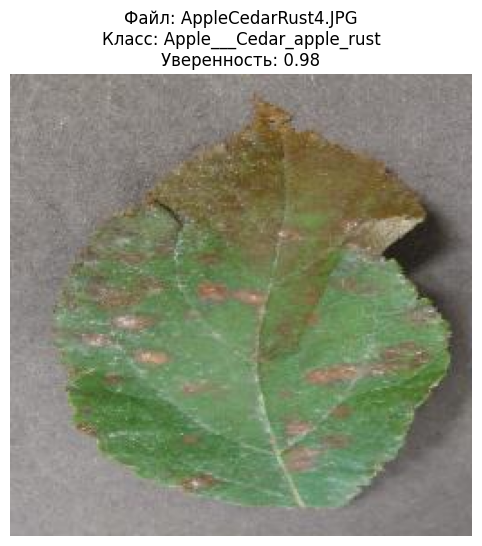

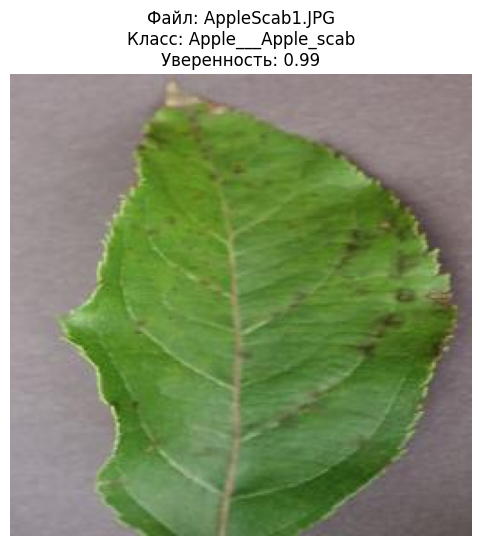

...

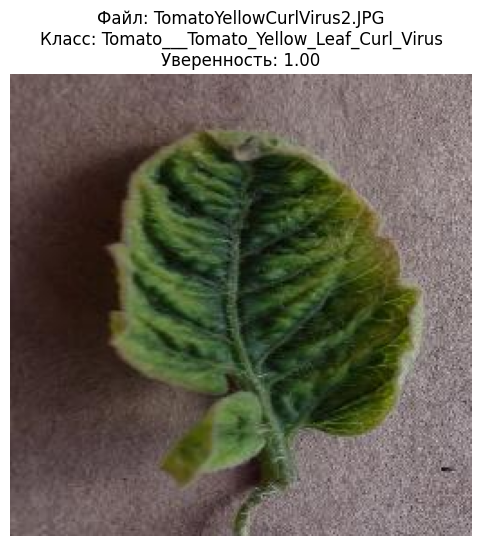

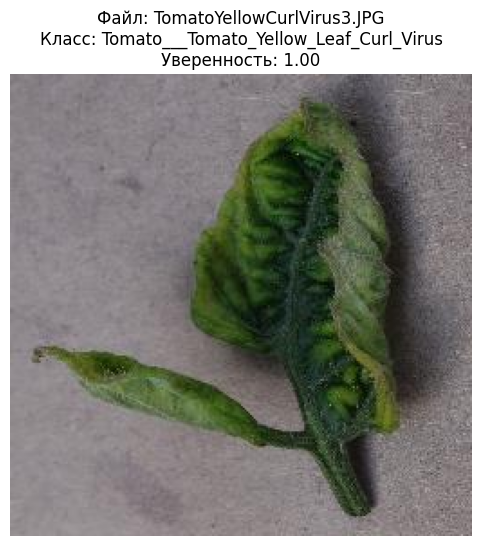

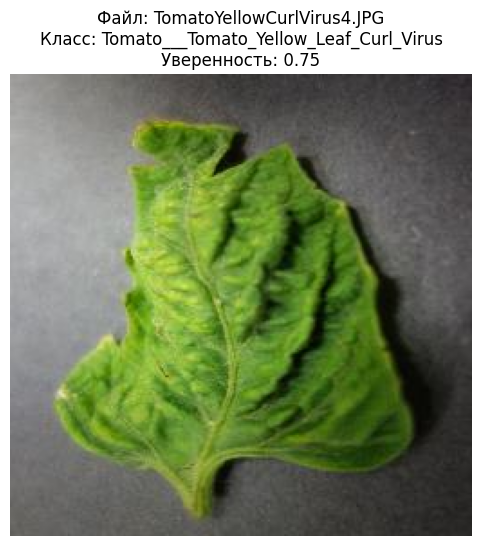

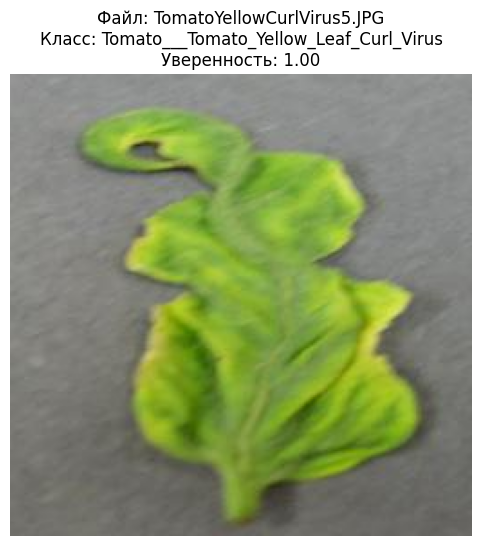

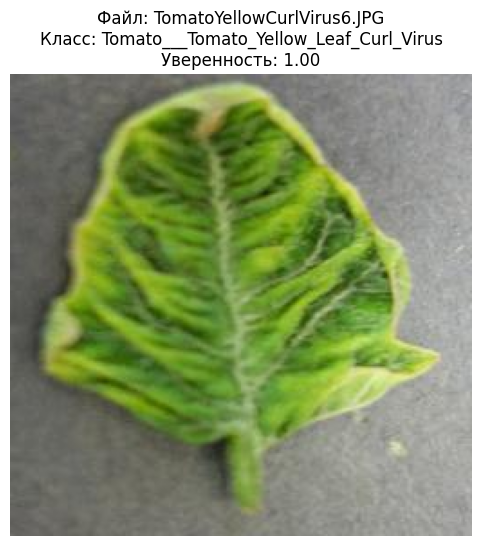

In [ ]:
test_dir = 'C:/Users/Krugl/Desktop/ВКР/archive/test/test'
test_images = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
class_names = train_dataset.classes

if not test_images:
    print("В папке нет изображений!")
else:
    for img_name in test_images:
        img_path = os.path.join(test_dir, img_name)
        
        try:
            img = Image.open(img_path)
            img_tensor = transform(img).unsqueeze(0).to(device)
            
            model.eval()
            with torch.no_grad():
                output = model(img_tensor)
                probabilities = torch.nn.functional.softmax(output[0], dim=0)
                predicted_idx = torch.argmax(probabilities).item()
                predicted_class = class_names[predicted_idx]
                confidence = probabilities[predicted_idx].item()
            
            plt.figure(figsize=(8, 6))
            plt.imshow(img)
            plt.title(f"Файл: {img_name}\nКласс: {predicted_class}\nУверенность: {confidence:.2f}", fontsize=12)
            plt.axis('off')
            plt.show()
            
        except Exception as e:
            print(f"Ошибка при обработке {img_name}: {str(e)}")